# TEST FAN landmarks detection on KDEF dataset

In [1]:
import os
import numpy as np
import face_alignment
from skimage import io
import matplotlib.pyplot as plt
import tqdm

from utils.load_config import load_config
from utils.load_data import load_data

np.random.seed(0)
np.set_printoptions(precision=3, suppress=True, linewidth=150)

### Get Parameters

In [2]:
# declare FAN network
fa = face_alignment.FaceAlignment(face_alignment.LandmarksType._2D, flip_input=False, device='cpu')

In [28]:
# define configuration
config_path = 'NR_01_KDEF_FAN_lmks_m0001.json'

# load config
config = load_config(config_path, path='../../configs/norm_reference')

### Get Training data

In [4]:
train_data = load_data(config, get_raw=True)
train_data[0] = np.array(train_data[0]).astype(int)
print("shape training_data[0]", np.shape(train_data[0]))

100%|██████████| 686/686 [00:03<00:00, 178.85it/s]


shape training_data[0] (686, 720, 720, 3)


In [5]:
# count number of items per category
for i in range(7):
    idexes = np.arange(len(train_data[1]))
    n_items = len((idexes[train_data[1] == i]))
    print("n_items for category {}: {}".format(i, n_items))

n_items for category 0: 98
n_items for category 1: 98
n_items for category 2: 98
n_items for category 3: 98
n_items for category 4: 98
n_items for category 5: 98
n_items for category 6: 98


In [6]:
def display_image(image, lmks=None, ref_lmks=None, lmk_size=5, figure=None):
    img = np.copy(image)

    lmk_padding = int(lmk_size/2)

    if ref_lmks is not None:
        # add lmk on image
        ref_lmks = np.array(ref_lmks).astype(int)
        for r_lmk in ref_lmks:
            img[r_lmk[1]-lmk_padding:r_lmk[1]+lmk_padding, r_lmk[0]-lmk_padding:r_lmk[0]+lmk_padding] = [0, 255, 0]

    if lmks is not None:
        # add lmk on image
        lmks = np.array(lmks).astype(int)
        for lmk in lmks:
            img[lmk[1]-lmk_padding:lmk[1]+lmk_padding, lmk[0]-lmk_padding:lmk[0]+lmk_padding] = [0, 0, 255]

    if figure is None:
        plt.figure()
        plt.imshow(img)
    else:
        figure.imshow(img)

In [7]:
def display_images(images, lmks=None, ref_lmks=None, n_max_col=7, size_img=4, lmk_size=5):
    n_image = len(images)

    # compute n_row and n_column
    n_col = np.min([n_max_col, n_image])
    n_row = int(n_image / n_col)

    # declare figure
    fig, axs = plt.subplots(n_row, n_col)
    fig.set_figheight(n_row*size_img)
    fig.set_figwidth(n_col*size_img)

    lmk_pos = None

    for i in range(n_row):
        for j in range(n_col):
            img_idx = i * n_col + j

            if lmks is not None:
                lmk_pos = lmks[img_idx]

            if n_row == 1 and n_col == 1:
                display_image(images[img_idx], lmks=lmk_pos, ref_lmks=ref_lmks, lmk_size=lmk_size, figure=axs)
            elif n_row == 1:
                display_image(images[img_idx], lmks=lmk_pos, ref_lmks=ref_lmks, lmk_size=lmk_size, figure=axs[img_idx])
            else:
                display_image(images[img_idx], lmks=lmk_pos, ref_lmks=ref_lmks, lmk_size=lmk_size, figure=axs[i, j])

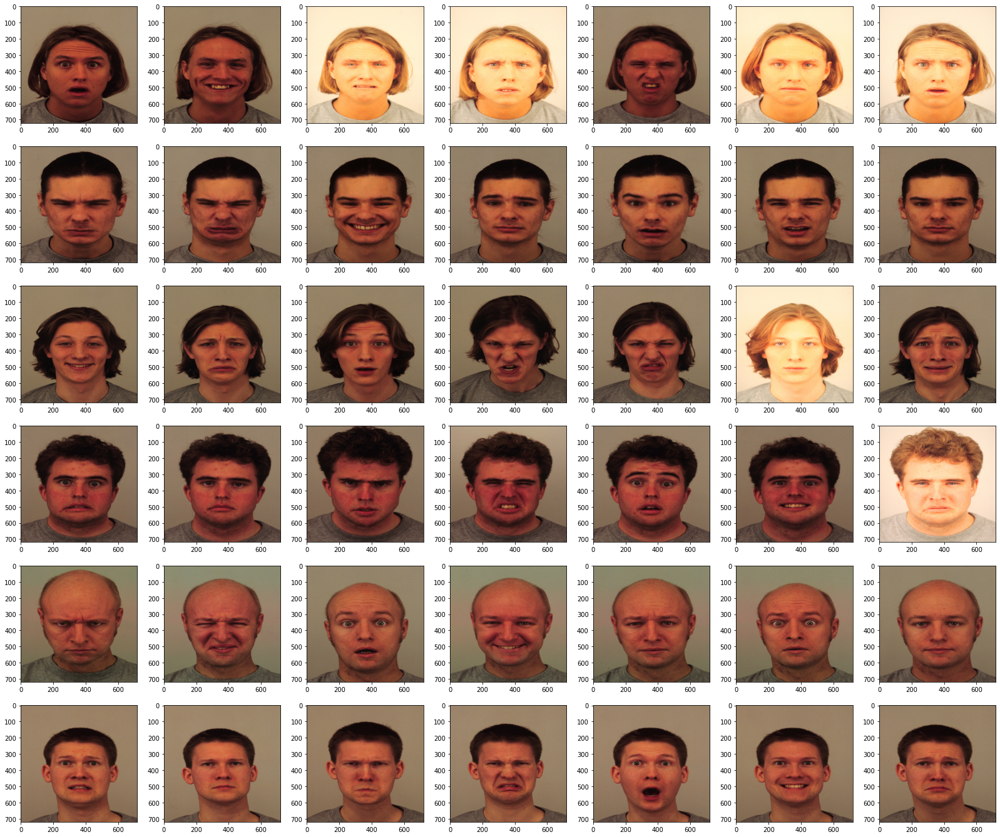

In [8]:
display_images(train_data[0][:42], n_max_col=7)

# Train Norm-reference encoding on BFS using FAN landmarks as input

In [9]:
def predict_lmks(data):
    # predict landmarks
    lmks_pos = []
    for i, img in enumerate(tqdm.tqdm(data)):
        lmk_preds = fa.get_landmarks(img)
        if lmk_preds is None:
            print(i, "no face detected")
            lmk_preds = np.zeros((1, 68, 2))
        lmks_pos.append(lmk_preds)
    return np.squeeze(np.array(lmks_pos))

In [10]:
lmks_pos = predict_lmks(train_data[0][:42])
print("shape lmks_pos", np.shape(lmks_pos))

100%|██████████| 42/42 [00:35<00:00,  1.18it/s]

shape lmks_pos (42, 68, 2)


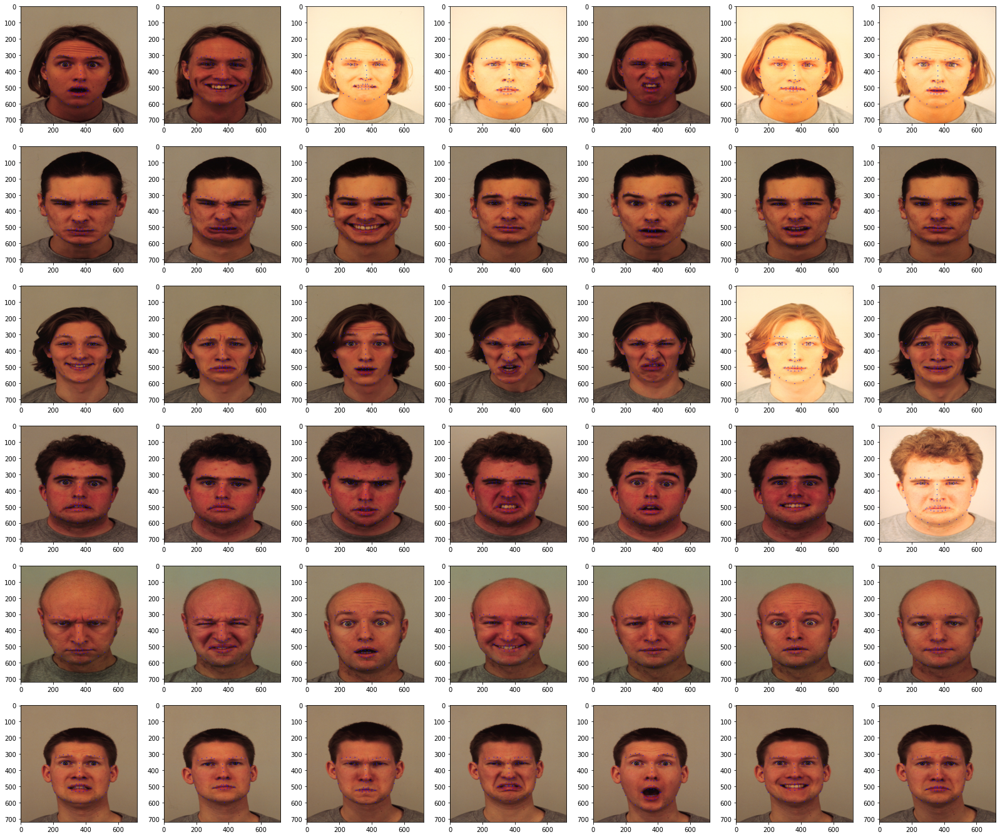

In [11]:
display_images(train_data[0][:42], lmks=lmks_pos)

shape sub_lmks_pos (42, 10, 2)


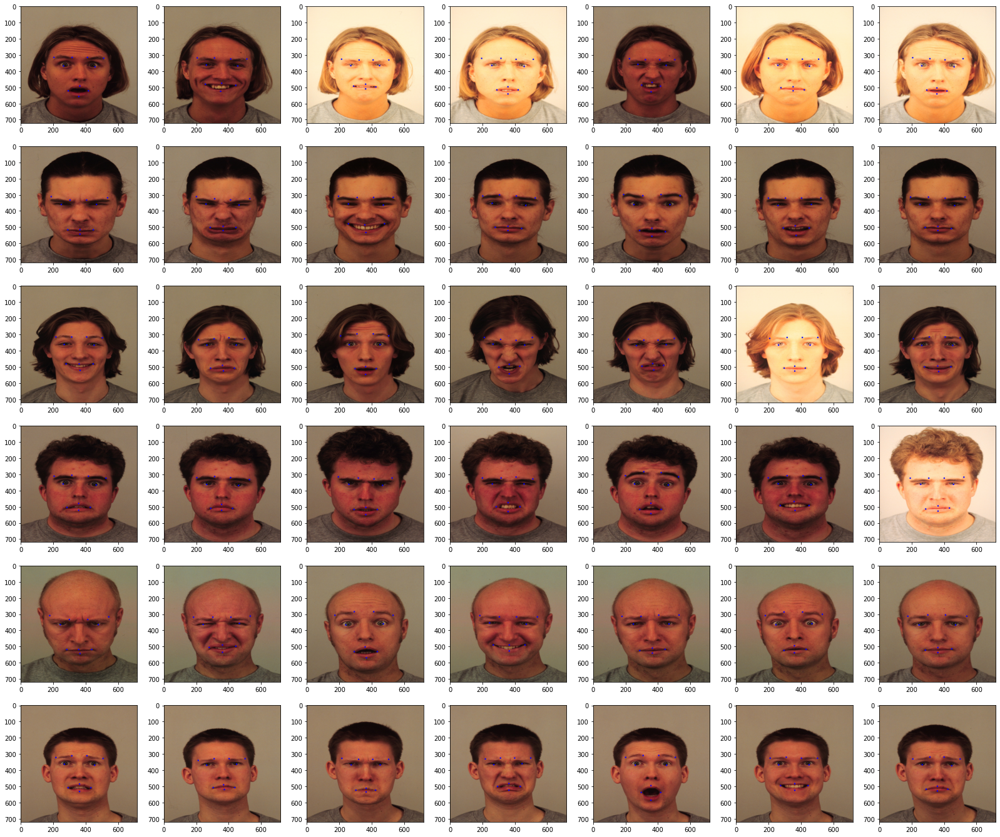

In [12]:
sub_idx = [17, 21, 22, 26, 48, 51, 54, 57, 41, 46]
sub_lmks_pos = lmks_pos[:, sub_idx, :]
print("shape sub_lmks_pos", np.shape(sub_lmks_pos))
display_images(train_data[0][:42], lmks=sub_lmks_pos, lmk_size=9)

# Train Norm-Reference Model

In [13]:
# find neutral expressions
neutral_idx = np.arange(42)
neutral_idx = neutral_idx[train_data[1][:42] == 0]
print("neutral_idx", neutral_idx)

# train ref vector
ref_vector = sub_lmks_pos[neutral_idx[0]]
print("ref_vector", np.shape(ref_vector))

neutral_idx [ 5 13 19 22 34 36]
ref_vector (10, 2)


In [18]:
# find expressions
expr_idexes = []
for i in range(7):
    e_idx = np.arange(42)
    e_idx = e_idx[train_data[1][:42] == i]
    print(i, "e_idx", e_idx)
    expr_idexes.append(e_idx[0])
print("expr_idexes", expr_idexes)

expr_lmks_pos = sub_lmks_pos[expr_idexes]
print("shape expr_lmks_pos", np.shape(expr_lmks_pos))
tun_vectors = expr_lmks_pos - np.repeat(np.expand_dims(ref_vector, axis=0), len(expr_idexes), axis=0)
# print("shape tun_vectors", np.shape(tun_vectors))

0 e_idx [ 5 13 19 22 34 36]
1 e_idx [ 1  9 14 26 31 40]
2 e_idx [ 3  7 17 23 28 37]
3 e_idx [ 2 10 15 27 32 41]
4 e_idx [ 0 11 16 25 30 39]
5 e_idx [ 6 12 20 21 33 35]
6 e_idx [ 4  8 18 24 29 38]
expr_idexes [5, 1, 3, 2, 0, 6, 4]
shape expr_lmks_pos (7, 10, 2)


In [19]:
# compute projections
def predict_NR(input, ref_vector, tun_vectors, nu=1, verbose=False):
    projections = []

    # normalize by norm of each landmarks
    norm_t = np.linalg.norm(tun_vectors, axis=2)

    # for each images
    for i in range(len(input)):
        # compute relative vector (difference)
        diff = input[i] - ref_vector
        proj = []
        # for each category
        for j in range(len(tun_vectors)):
            proj_length = 0
            # for each landmarks
            for k in range(len(ref_vector)):
                if norm_t[j, k] != 0.0:
                    f = np.dot(diff[k], tun_vectors[j, k]) / norm_t[j, k]
                    f = np.power(f, nu)
                else:
                    f = 0
                proj_length += f
            # ReLu activation
            if proj_length < 0:
                proj_length = 0
            proj.append(proj_length)
        projections.append(proj)

    projections = np.array(projections)

    if verbose:
        print("projections", np.shape(projections))
        print(projections)

    return np.argmax(projections, axis=1)

In [21]:
preds = predict_NR(expr_lmks_pos, ref_vector, tun_vectors, nu=config['nu'], verbose=True)
print("shape preds", np.shape(preds))
print(preds)

projections (7, 7)
[[  0.      0.      0.      0.      0.      0.      0.   ]
 [  0.    115.067   0.     42.775   0.      0.     39.086]
 [  0.      0.     65.904   0.     46.184  48.206   8.831]
 [  0.     23.494   0.    126.154   0.      0.     99.046]
 [  0.     24.884  85.776   0.    128.913  88.821  23.51 ]
 [  0.      0.     67.771   0.     70.007  92.427   4.414]
 [  0.     65.889   0.    134.062  18.876   0.    152.12 ]]
shape preds (7,)
[0 1 2 3 4 5 6]


## TEST model on BFS

In [22]:
test_data = load_data(config, train=False, get_raw=True)
test_data[0] = np.array(test_data[0]).astype(int)

100%|██████████| 294/294 [00:01<00:00, 173.30it/s]


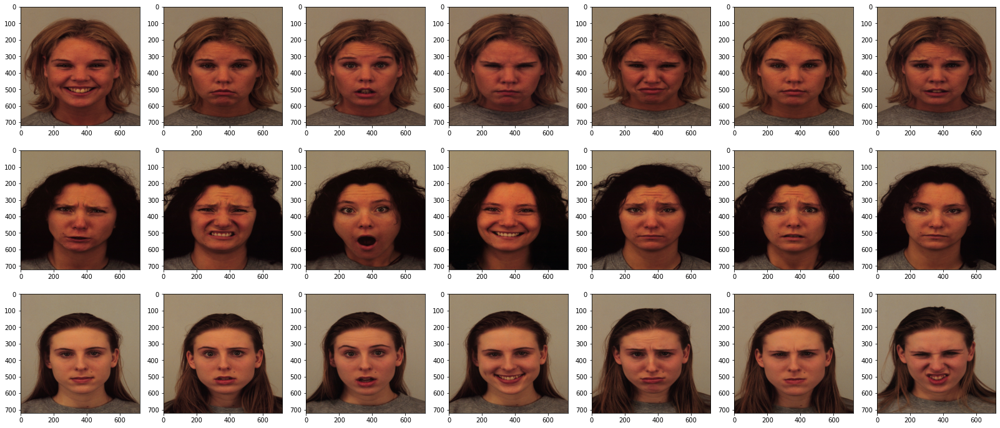

In [23]:
display_images(test_data[0][:21])

In [24]:
# predict lmks on test_data
test_lmks_pos = predict_lmks(test_data[0])

100%|██████████| 294/294 [09:29<00:00,  1.94s/it] 


In [25]:
print("shape test_lmks_pos", np.shape(test_lmks_pos))
sub_test_lmks_pos = test_lmks_pos[:, sub_idx, :]
print("shape sub_test_lmks_pos", np.shape(sub_test_lmks_pos))
nr_test_preds = predict_NR(sub_test_lmks_pos, ref_vector, tun_vectors, nu=config['nu'])

shape test_lmks_pos (294, 68, 2)
shape sub_test_lmks_pos (294, 10, 2)


In [26]:
corrects = [1 for i in range(len(nr_test_preds)) if nr_test_preds[i] == test_data[1][i]]
n_corrects = np.sum(corrects)
accuracy = n_corrects / len(nr_test_preds)
print("accuracy:", accuracy)

accuracy: 0.36394557823129253
